# 5c. Breast cancer MEZ-XRF analysis
## 1. Summary
This notebook quantifies channel features and generates the figures associated with the XRF breast cancer microarray scans comprising Figure 4 in the MEZ-XRF paper.

In [1]:
import pathlib
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import squidpy as sq

import h5py
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from shutil import copyfile

import sys
sys.path.insert(0, '..\\code\\')
import high_plex_hdf as hph
import hph_adata_analysis as hph_adata

In [2]:
# Set data directory to work from 
base_dir = "C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF"
base_dir = pathlib.Path(base_dir)
base_dir_sub = base_dir / 'data' / 'processed' / 'xrf'

# Specify the input directory containing hdf deconvoluted files
deconv_dir = base_dir_sub / '2_deconvoluted_hdfs' / 'summary_hdfs'

# Specify the input directory containing hdf files of images and masks
hdf_dir = base_dir_sub / '5a_cell_segmentation'

# Make output directory segmented images
out_dir = base_dir_sub / '5c_breast_cancer_quantification'
out_dir.mkdir(parents=True, exist_ok=True)
print('Quantified hdf files will be output to: \n\t', out_dir) 

# Read in scans and original scan metadata
df_hdf_files = pd.read_csv(base_dir_sub / '1_reduced_reshaped_hdfs' / 'preprocessed_hdf_config_files.csv')
df_hdf_metadata = pd.read_csv(base_dir_sub / '1_reduced_reshaped_hdfs' / 'xrf_scan_metadata_full.csv')

Quantified hdf files will be output to: 
	 C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5c_breast_cancer_quantification


In [3]:
samples_dict_overview = {
    'sample304_0001': 'BC-1',
    'sample304_0002': 'BC-2',
    'sample304_b_0001': 'BC-3',
}

samples_path = ['HER2$^{+}$', 'LumA', 'LumB HER2$^{-}$']
samples_path_dict_overview = dict(
    zip(
        list(samples_dict_overview.values()),
        samples_path
    )
)
    

samples_dict_rois = {
    'sample304_b_0002': 'BC-1 inset',
    'sample304_b_0003': 'BC-2 inset',
    'sample304_b_0004': 'BC-3 inset',    
}

samples_path_dict_rois = dict(
    zip(
        list(samples_dict_rois.values()),
        samples_path
    )
)

hdf_overview_filepaths = []
for sample in samples_dict_overview:
    hdf_overview_filepaths.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])
    
hdf_roi_filepaths = []
for sample in samples_dict_rois:
    hdf_roi_filepaths.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])

In [4]:
samples_path

['HER2$^{+}$', 'LumA', 'LumB HER2$^{-}$']

In [5]:
image_n = '2_beam_intensity_norm'

mask_n = 'matched_cell_mask'
adata_overview = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_overview_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_overview.write(out_dir.joinpath('adata_breast_cancer_overview_matched_whole_cell.h5ad'))

image_n = '2_beam_intensity_norm'

mask_n = 'matched_cell_mask'
adata_roi = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_roi_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_roi.write(out_dir.joinpath('adata_breast_cancer_roi_matched_whole_cell.h5ad'))

image_n = '2_beam_intensity_norm'

mask_n = 'matched_nuclei_mask'
adata_nuclear = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_roi_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_nuclear.write(out_dir.joinpath('adata_breast_cancer_roi_matched_nuclear.h5ad'))

image_n = '2_beam_intensity_norm'

mask_n = 'matched_non_nuclei_mask'
adata_non_nuclear = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_roi_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_non_nuclear.write(out_dir.joinpath('adata_breast_cancer_roi_matched_non_nuclear.h5ad'))

... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical


In [6]:
plot_channels= [
    'Ce_Ka', 
    'Dy_Ka', 
    'Er_Ka', 
    'Eu_Ka', 
    'Gd_Ka', 
    'Ho_Ka', 
    'In_Ka', 
    'La_Ka',
    'Lu_Ka', 
    'Nd_Ka', 
    'Pr_Ka', 
    'Rh_Ka', 
    'Sm_Ka', 
    'Tb_Ka', 
    'Tm_Ka', 
    'Y_Ka',
    'Yb_Ka'
]

fig_channels_1= [
    'Ho_Ka', 
    'Lu_Ka', 
    'Er_Ka',
    'Tm_Ka', 
    'Gd_Ka',
    'Nd_Ka', 
    'Ce_Ka',
]

fig_channels_2= [
    'In_Ka',
    'Pr_Ka',
    'La_Ka',
    'Y_Ka',
    'Sm_Ka',
    'Tb_Ka',
    'Yb_Ka'
]

..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


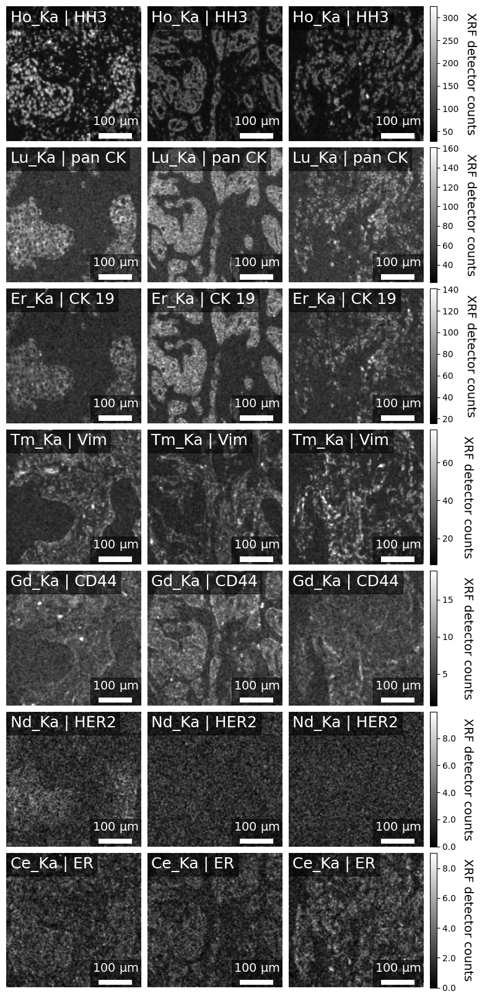

In [7]:
from importlib import reload  # Python 3.4+
reload(hph_adata)

hph_adata.adata_hph_channels_plot(
    adata_overview, 
    plot_name='longname', 
    plot_channels=fig_channels_1,
    hdf_image_key='raw',
    scale_length=100,
#     lower_p=0.0001,
#     lower_p_abs_0=True,
    legend_fontsize = 18
)

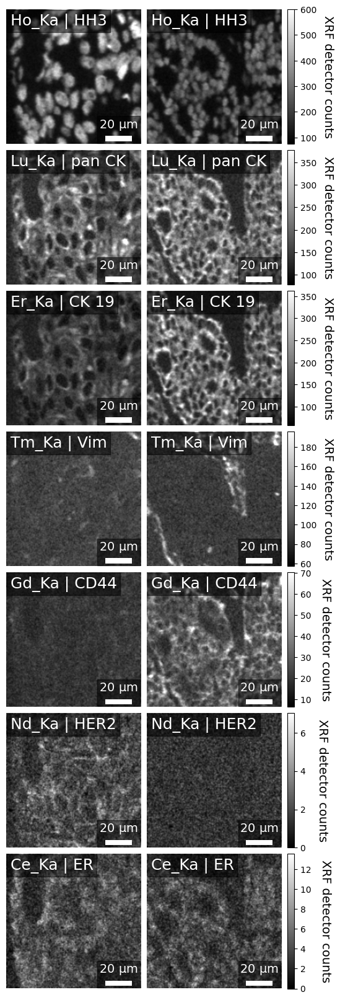

In [8]:
hph_adata.adata_hph_channels_plot(
    adata_roi, 
    hdf_ids = ['BC-1 inset', 'BC-2 inset'],
    plot_name='longname', 
    plot_channels=fig_channels_1,
    hdf_image_key='raw',
    scale_length=20,
#     lower_p_abs_0=True,
    legend_fontsize = 18
)



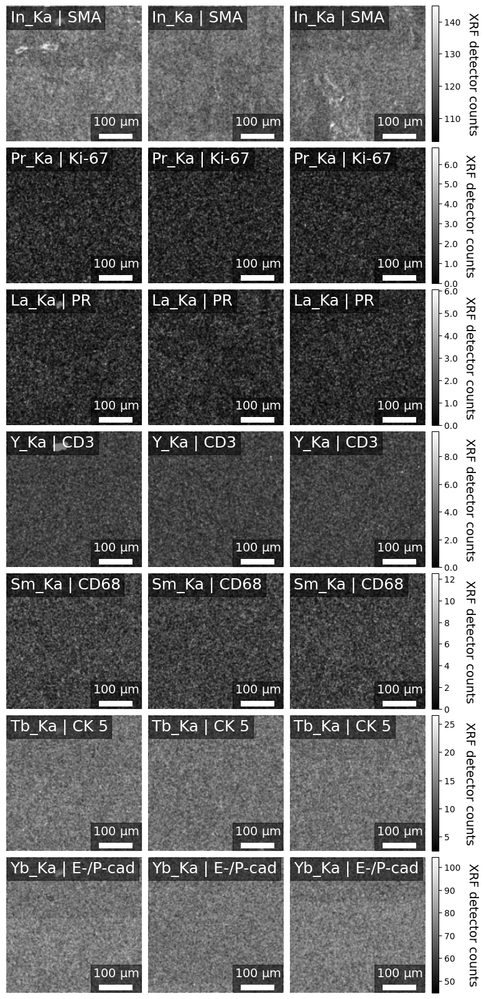

In [9]:
hph_adata.adata_hph_channels_plot(
    adata_overview, 
    plot_name='longname', 
    plot_channels=fig_channels_2,
    hdf_image_key='raw',
    scale_length=100,
    legend_fontsize = 18
)

In [10]:
sup6_channels = ['Pr_Ka', 'Yb_Ka']
print(fig_channels_2)
print(sup6_channels)

['In_Ka', 'Pr_Ka', 'La_Ka', 'Y_Ka', 'Sm_Ka', 'Tb_Ka', 'Yb_Ka']
['Pr_Ka', 'Yb_Ka']


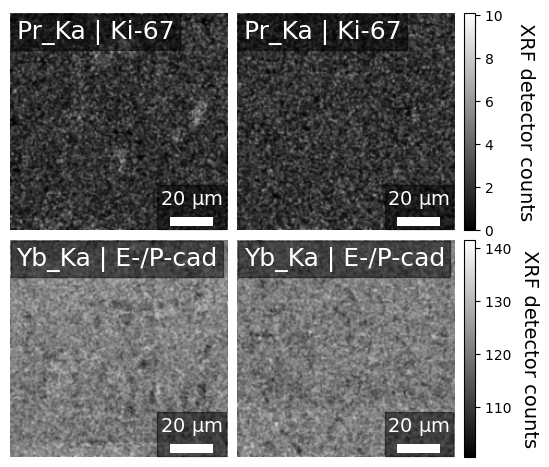

In [11]:
hph_adata.adata_hph_channels_plot(
    adata_roi, 
    hdf_ids = ['BC-1 inset', 'BC-2 inset'],
    plot_name='longname', 
    plot_channels=sup6_channels,
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize = 18
)

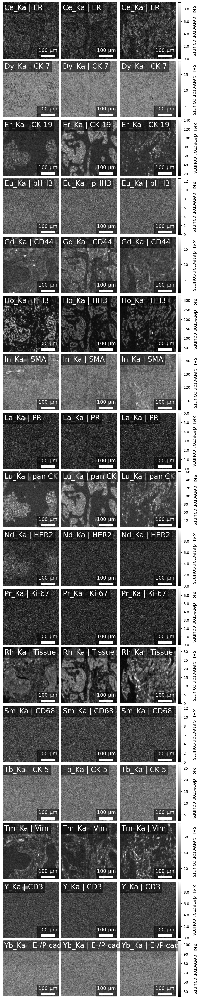

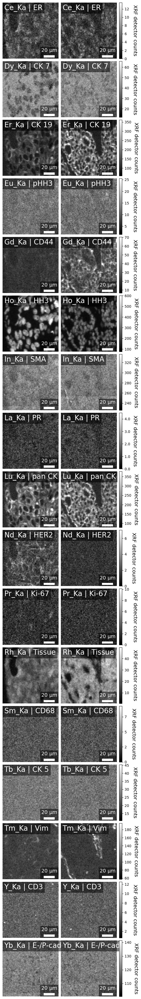

In [12]:
hph_adata.adata_hph_channels_plot(
    adata_overview, 
    plot_name='longname', 
    plot_channels=plot_channels,
    hdf_image_key='raw',
    scale_length=100
)

hph_adata.adata_hph_channels_plot(
    adata_roi, 
    hdf_ids = ['BC-1 inset', 'BC-2 inset'],
    plot_name='longname', 
    plot_channels=plot_channels,
    hdf_image_key='raw',
    scale_length=20
)

## 2. Subcellular localisation
The following section measures the subcellular localisation of markers (nuclear or non-nuclear).

In [13]:
adata_nuc = ad.read_h5ad(out_dir.joinpath('adata_breast_cancer_roi_matched_nuclear.h5ad'))
adata_non_nuc = ad.read_h5ad(out_dir.joinpath('adata_breast_cancer_roi_matched_non_nuclear.h5ad'))

assert adata_nuc.shape == adata_non_nuc.shape

region_measures = [
    'label_id',
    'sample',
    'channel',
    'longname',
    'nuclear_mean_counts',
    'non_nuclear_mean_counts'
]

# Build dataframe of matched nuclear and non-nuclear measurements
df_nuc_non_nuc = pd.DataFrame(columns=region_measures)
for event in adata_nuc.obs.index:
    region_measures=dict.fromkeys(region_measures)  
    region_measures['label_id'] = event
    
    event_nuc_measures = adata_nuc[adata_nuc.obs.index == event]
    event_non_nuc_measures = adata_non_nuc[adata_non_nuc.obs.index == event]
    region_measures['sample'] = adata_nuc.obs['sample_name_ref'][
        adata_nuc.obs.index == event
    ].iloc[0]
    
    for channel in adata_nuc.var.index:
        region_measures['channel'] = channel
        region_measures['longname'] = adata_nuc.var.longname[
            adata_nuc.var.index == channel
        ].iloc[0]
        
        region_measures['nuclear_mean_counts'] = event_nuc_measures[:, channel].X[0][0]
        region_measures['non_nuclear_mean_counts'] = event_non_nuc_measures[:, channel].X[0][0]
        
        df_nuc_non_nuc = df_nuc_non_nuc.append(region_measures, ignore_index=True)



C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [14]:
df_nuc_non_nuc[df_nuc_non_nuc['non_nuclear_mean_counts'] == 0] = float("NaN")


In [15]:

# Evaluate nuclear and non-nuclear ratios per marker
df_nuc_non_nuc['nuclear/non_nuclear'] = (
    df_nuc_non_nuc['nuclear_mean_counts'] / 
    df_nuc_non_nuc['non_nuclear_mean_counts']
)

df_nuc_non_nuc['log2(nuclear/non-nuclear)'] = (
    df_nuc_non_nuc['nuclear/non_nuclear'].apply(np.log2)    
)

# Reindex markers according to average expression of the channel
rank_df_nuc_non_nuc = df_nuc_non_nuc.groupby(['channel']).mean()
rank_df_nuc_non_nuc = rank_df_nuc_non_nuc.sort_values('log2(nuclear/non-nuclear)').reset_index()

channel_list = rank_df_nuc_non_nuc['channel'].to_list()
channel_order = dict(zip(channel_list, range(len(channel_list))))

df_nuc_non_nuc['rank'] = df_nuc_non_nuc['channel'].map(channel_order)
df_nuc_non_nuc = df_nuc_non_nuc.sort_values('rank').reindex()


In [16]:
df_nuc_non_nuc['Sample'] = df_nuc_non_nuc['sample'].map(samples_path_dict_rois)

In [17]:
df_nuc_non_nuc['sample'].unique()

array(['BC-1 inset', 'BC-2 inset', 'BC-3 inset', nan], dtype=object)

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5c_breast_cancer_quantification\Fig3J_CellMarkerDistribution.svg


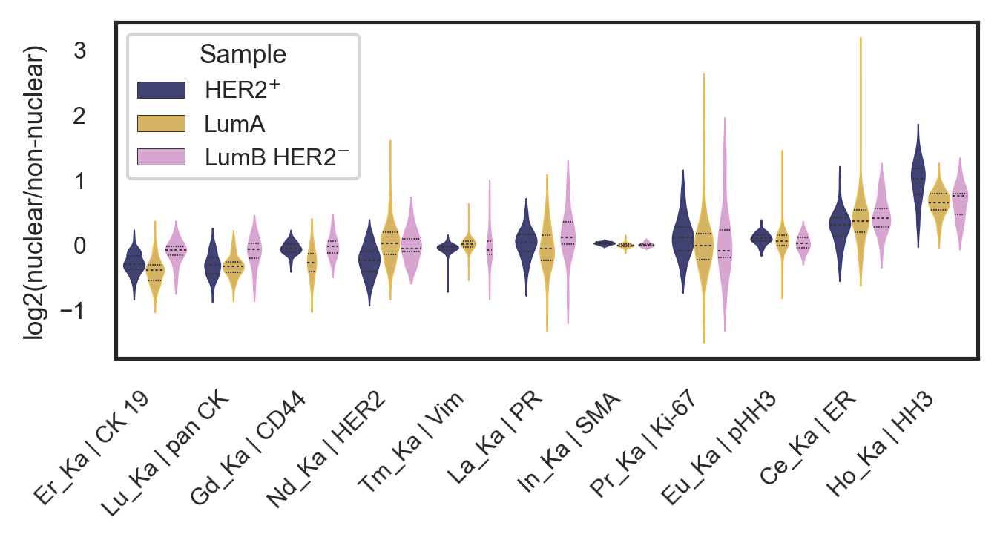

In [18]:
from matplotlib.collections import PolyCollection

subcellular_channels= [
    'Ce_Ka', 
    'Er_Ka', 
    'Eu_Ka', 
    'Gd_Ka', 
    'Ho_Ka', 
    'La_Ka',
    'Lu_Ka', 
    'Nd_Ka', 
    'Pr_Ka', 
    'Tm_Ka', 
    'In_Ka',
]
df_nuc_non_nuc_sel = df_nuc_non_nuc[df_nuc_non_nuc['channel'].isin(subcellular_channels)]

sns.set(font_scale=0.7)
sns.set_style('white')
fig, axs = plt.subplots(dpi=300, figsize=(5,2))

palette=['#393b79', '#e7ba52', '#de9ed6']
ax = sns.violinplot(
    data = df_nuc_non_nuc_sel,
    x = 'longname',
    y = 'log2(nuclear/non-nuclear)',       
    hue = 'Sample',
    #hue_order = ['BC-1 inset', 'BC-2 inset', 'BC-3 inset'],
    palette=palette,
    ax=axs,
    inner='quartiles',
    linewidth=0.5
    )

xlabels = axs.get_xticklabels() 
axs.set(xlabel='')

plt.xticks(rotation=45, ha='right')

violins = [art for art in ax.get_children() if isinstance(art, PolyCollection)]
n=3
colors = sns.color_palette(palette, n_colors=n) * (len(violins)//n)
for i in range(len(violins)):
    violins[i].set_edgecolor(colors[i])

plt.legend(title='Sample')

savename = out_dir / 'Fig3J_CellMarkerDistribution.svg'
print(savename)
plt.savefig(savename, bbox_inches='tight')

plt.show()

## 3. Cell type clustering
Specify the informative channels on which to cluster and annotate these to adata.

In [19]:
adata = ad.read_h5ad(out_dir.joinpath('adata_breast_cancer_overview_matched_whole_cell.h5ad'))
adata.raw = adata

cluster_channels = [
     'Ce_Ka',
    # 'Y_Ka',
     'Gd_Ka',
    # 'Ho_Ka',
     'La_Ka',
     'In_Ka',
    # 'Rh_Ka',
    'Nd_Ka',
    'Lu_Ka',
    # 'area',
         'Pr_Ka',

     'Er_Ka',
    'Tm_Ka',
    # 'eccentricity'

    # 'Lu_L3'
    ]

cluster_channel_var = []
for i in adata.var.index: 
    cluster_channel_var.append(i in cluster_channels)
adata.var['cluster_channels'] = cluster_channel_var
adata.var['cluster_channels'] = adata.var['cluster_channels'].astype('category')

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


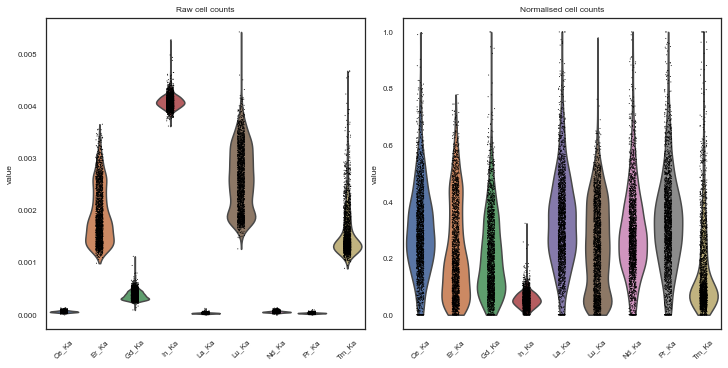

In [20]:
adata = adata[:, adata.var['cluster_channels']==True]

normalised_data = adata.X.copy()
normalised_data = hph_adata.column_percentile_normalise_test(
    normalised_data, 
    2, 
    98, 
    crop=False
)
adata.X = normalised_data

fig, axs = plt.subplots(1, 2, figsize=(10,5), constrained_layout=True)
set_xticklabels = {'labels': list(adata.var_names), 'rotation':45}
g1 = sc.pl.violin(
    adata, 
    adata.var_names, 
    ax=axs[0], 
    show=False, 
    use_raw=True,
    **set_xticklabels
    #set_xticklabels=set_xticklabels
)
g2 = sc.pl.violin(
    adata, 
    adata.var_names, 
    ax=axs[1], 
    show=False, 
    use_raw=False,
    **set_xticklabels
    #set_xticklabels=set_xticklabels
)

axs[0].title.set_text('Raw cell counts')
axs[1].title.set_text('Normalised cell counts')                      

plt.show()

In [21]:
# Add sample pathology names
adata.obs['sample_pathology_names'] = adata.obs['sample_name_ref'].map(samples_path_dict_overview)

Trying to set attribute `.obs` of view, copying.


In [22]:
#adata.uns['sample_pathology_names'] = adata.uns['sample_name_ref_colors']


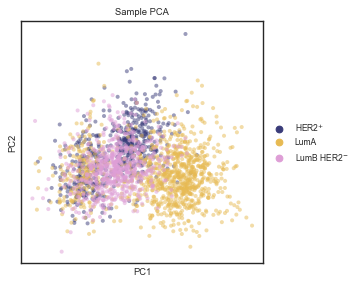

In [23]:
# Principal component analyses
sc.tl.pca(adata, svd_solver='arpack')

# Plot out principal components
fig, axs = plt.subplots(figsize=(4,4), dpi=80)
sc.pl.pca(
    adata, 
    color='sample_pathology_names', 
    palette = 'tab20b',
    ax=axs, 
    title='Sample PCA', 
    show=False,
    **{'alpha':0.5}
)
plt.axis('square')
plt.show()

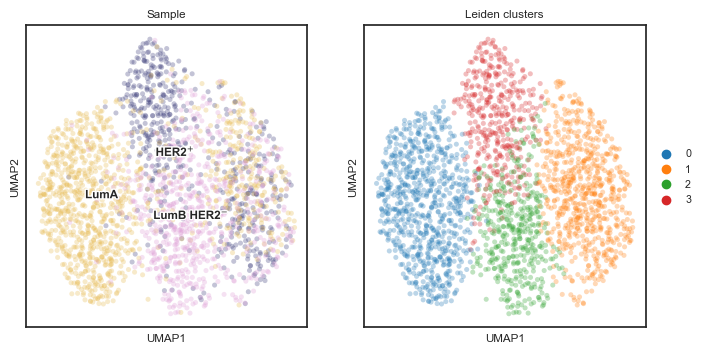

In [30]:
sc.pp.neighbors(adata, n_neighbors=50)
sc.tl.umap(adata, random_state=5)
sc.tl.leiden(adata, resolution=0.5)

adata.uns['leiden_colors'] = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']#, '#9467bd', '#8c564b']

fig, axs = plt.subplots(1, 2, figsize=(8,4), dpi=100)#, constrained_layout=True)
sc.pl.umap(
    adata, 
    color='sample_pathology_names',
    palette = 'tab20b',
    ax=axs.flatten()[0], 
    frameon=True, 
    show=False,
    legend_loc='on data',
    legend_fontoutline=2,
    title = 'Sample',
    **{'alpha':0.3}
    )
sc.pl.umap(
    adata, 
    color='leiden', 
#     palette = 'tab20',
    ax=axs.flatten()[1], 
    frameon=True, 
    show=False,
    title = 'Leiden clusters',
    **{'alpha':0.3}
    )
plt.show()

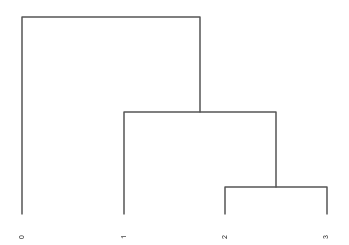

In [31]:
sc.tl.dendrogram(adata, groupby = "leiden", cor_method='spearman')
dendrogram = sc.pl.dendrogram(adata, groupby = "leiden")

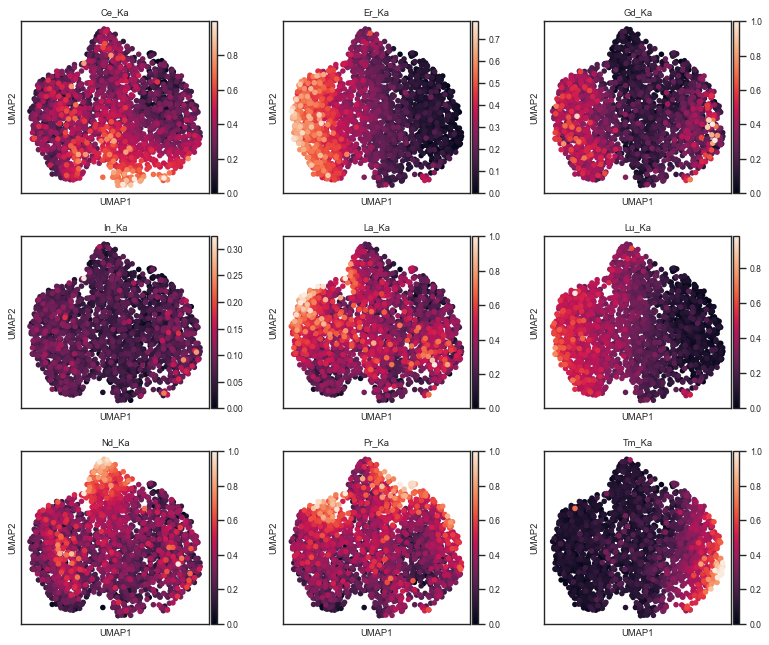

In [32]:
with rc_context({'figure.figsize': (3, 3), 'figure.dpi': 80}):
    sc.pl.umap(
        adata, 
        color=adata.var_names, 
        ncols=3, 
        # frameon=False, 
        show=False, 
        use_raw=False, 
        size=100,
        # legend='off'
    )
plt.show()

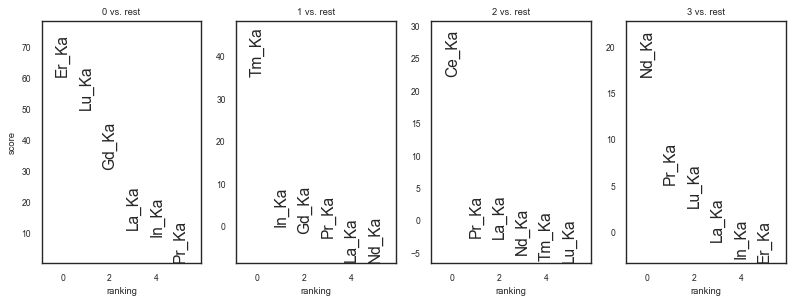

In [33]:
sc.tl.rank_genes_groups(adata, 
                        groupby='leiden', 
                        use_raw=False, 
                        method='t-test_overestim_var', 
                        # method='t-test', 
                        n_genes=6
                        ) # compute differential expression
     
with rc_context({'figure.figsize': (3, 4), 'figure.dpi': 80}):
    sc.pl.rank_genes_groups(
        adata, 
        groupby='leiden', 
        n_genes=6, 
        ncols=6, 
        sharey=False, 
        fontsize=14
    )
    
# Manually curate cluster names based on marker differences
cluster2annotation = {
    '0': 'Epithelial',
    '1': 'Stromal',
    '3': 'HER2+ epithelial',
    '2': 'ER+ epithelial',
}

# Annotate adata with leiden cell type cluster names
adata.obs['leiden_cluster_names'] = adata.obs['leiden'].map(cluster2annotation).astype('category')

In [34]:
adata.obs

,centroid-0,centroid-1,orientation,major_axis_length,minor_axis_length,area,eccentricity,perimeter,label_id,sample_name_ref,step_um,AB_panel,hph_mask_key,hph_image_key,hph_id,sample_pathology_names,leiden,leiden_cluster_names
0-2,1.083333,157.166667,1.406441,4.894994,2.969311,12,0.795006,10.242641,2,BC-1,2.0,breast_cancer_panel,matched_cell_mask,2_beam_intensity_norm,BC-1,HER2$^{+}$,1,Stromal
0-6,1.583333,149.250000,1.517428,7.053772,4.297269,24,0.793004,16.242641,6,BC-1,2.0,breast_cancer_panel,matched_cell_mask,2_beam_intensity_norm,BC-1,HER2$^{+}$,1,Stromal
0-7,1.625000,190.750000,-1.311223,4.837184,4.165532,16,0.508354,12.242641,7,BC-1,2.0,breast_cancer_panel,matched_cell_mask,2_beam_intensity_norm,BC-1,HER2$^{+}$,2,ER+ epithelial
0-8,1.952381,126.761905,-1.198494,5.428919,4.943750,21,0.413217,14.485281,8,BC-1,2.0,breast_cancer_panel,matched_cell_mask,2_beam_intensity_norm,BC-1,HER2$^{+}$,2,ER+ epithelial
0-11,2.500000,57.437500,-1.408873,9.907372,6.200656,48,0.779933,24.485281,11,BC-1,2.0,breast_cancer_panel,matched_cell_mask,2_beam_intensity_norm,BC-1,HER2$^{+}$,1,Stromal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2-1064,198.444444,3.777778,-1.488222,5.274258,1.946056,9,0.929440,9.207107,1064,BC-3,2.0,breast_cancer_panel,matched_cell_mask,2_beam_intensity_norm,BC-3,LumB HER2$^{-}$,1,Stromal
2-1065,198.600000,74.800000,1.249046,3.098387,1.788854,5,0.816497,5.207107,1065,BC-3,2.0,breast_cancer_panel,matched_cell_mask,2_beam_intensity_norm,BC-3,LumB HER2$^{-}$,1,Stromal
2-1066,198.000000,95.000000,0.785398,3.265986,3.265986,9,0.000000,8.000000,1066,BC-3,2.0,breast_cancer_panel,matched_cell_mask,2_beam_intensity_norm,BC-3,LumB HER2$^{-}$,1,Stromal
2-1069,198.173913,182.782609,1.522283,9.662047,3.009477,23,0.950255,17.621320,1069,BC-3,2.0,breast_cancer_panel,matched_cell_mask,2_beam_intensity_norm,BC-3,LumB HER2$^{-}$,2,ER+ epithelial


C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5c_breast_cancer_quantification\Fig3H_CellMarkerDistribution.svg


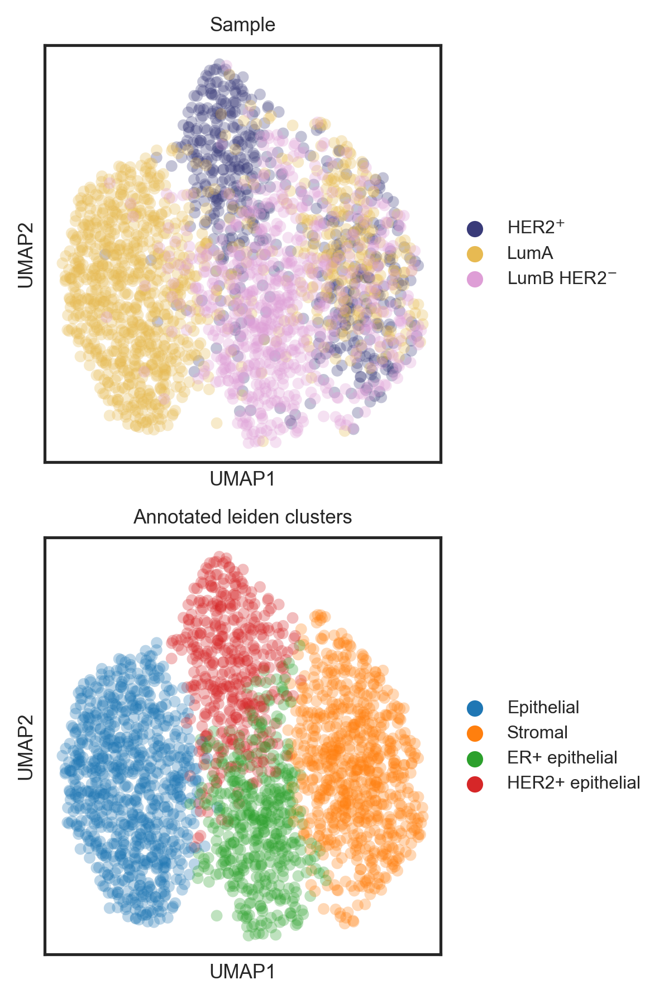

In [42]:
adata.uns['leiden_cluster_names_colors']  = adata.uns['leiden_colors'] 

fig, axs = plt.subplots(2, 1, figsize=(4,6), dpi=300)#, constrained_layout=True)
sc.pl.umap(
    adata, 
    color='sample_pathology_names',
    palette = 'tab20b',
    ax=axs.flatten()[0], 
    frameon=True, 
    show=False,
    #legend_loc='on data',
    legend_fontoutline=2,
    title = 'Sample',
    size=100,
    **{'alpha':0.3}
    )
sc.pl.umap(
    adata, 
    color='leiden_cluster_names', 
    ax=axs.flatten()[1], 
    frameon=True, 
    show=False,
    #legend_loc='best',
    legend_fontoutline=2,
    title = 'Annotated leiden clusters',
    size=100,
    **{'alpha':0.3}
    )

fig.tight_layout(pad=1)

savename = out_dir / 'Fig3H_CellMarkerDistribution.svg'
print(savename)
fig.savefig(savename, bbox_inches='tight')

plt.show()

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5c_breast_cancer_quantification\Fig3H_CellMarkerDistribution.svg


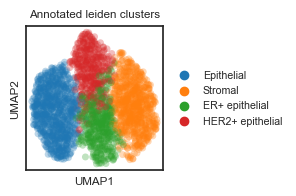

In [46]:
adata.uns['leiden_cluster_names_colors']  = adata.uns['leiden_colors'] 

fig, axs = plt.subplots(figsize=(3,2), dpi=100)#, constrained_layout=True)

sc.pl.umap(
    adata, 
    color='leiden_cluster_names', 
    ax=axs, 
    frameon=True, 
    show=False,
    #legend_loc='best',
    legend_fontoutline=2,
    title = 'Annotated leiden clusters',
    size=100,
    **{'alpha':0.3}
    )

fig.tight_layout(pad=1)

savename = out_dir / 'Fig3H_CellMarkerDistribution.svg'
print(savename)
fig.savefig(savename, bbox_inches='tight')

plt.show()

546
550
1046
1067
650
653


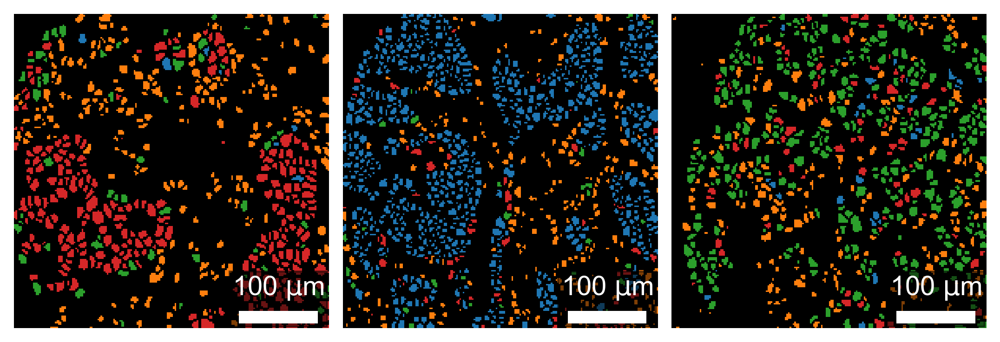

In [37]:
hph_adata.adata_hph_mask_cluster_plot(
    adata=adata,
    cluster_name='leiden',
    mask_key = 'matched_cell_mask',
    plot_names=['','',''],
    scale_length = 100
    )

In [38]:
adata.uns['sample_name_ref_colors']

KeyError: 'sample_name_ref_colors'

In [39]:
hph_fpaths_check = hph_adata.adata_uns_hdf_fpaths(adata)
for sample in hph_fpaths_check:
    with h5py.File(hph_fpaths_check[sample], 'r') as hdf:
        mask = hdf['masks/matched_cell_mask'][...]
        print(len(np.unique(mask[mask !=0])))

550
1067
653
